# Bicubic Interpolation

**Bicubic interpolation** is a standard and simple method for upscaling images, and it provides a solid baseline for comparison. The smooth but blurry nature of bicubic interpolation is a well-known characteristic, making it a good reference point to demonstrate the improvements brought by more advanced super-resolution techniques.

In [1]:
import os
import glob
import torch
import random
import numpy as np
import pandas as pd
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torchvision.transforms import v2
from torchmetrics.image import PeakSignalNoiseRatio
from torchmetrics.image import StructuralSimilarityIndexMeasure
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Model and data preparation

In [5]:
HR_valid_paths = sorted(glob.glob("./data/DIV2K/DIV2K_valid_HR/*.png"))
X2_valid_paths = sorted(glob.glob("./data/DIV2K/DIV2K_valid_LR_bicubic/X2/*.png"))
X4_valid_paths = sorted(glob.glob("./data/DIV2K/DIV2K_valid_LR_bicubic/X4/*.png"))
X8_valid_paths = sorted(glob.glob("./data/DIV2K/DIV2K_valid_LR_bicubic/X8/*.png"))
X16_valid_paths = sorted(glob.glob("./data/DIV2K/DIV2K_valid_LR_bicubic/X16/*.png"))
X32_valid_paths = sorted(glob.glob("./data/DIV2K/DIV2K_valid_LR_bicubic/X32/*.png"))
X64_valid_paths = sorted(glob.glob("./data/DIV2K/DIV2K_valid_LR_bicubic/X64/*.png"))

Throughout all my experiments I am going to use 3 metrics
1) Peak Signal-to-Noise Ratio (**PSNR**)
   - It measures pixel-wise similarity based on Mean Squared Error (**MSE**)
   - Higher is better
   - **Limitations**:
        - Highly sensitive to small pixel changes but doesn’t align well with human perception
        - Does not consider structural or perceptual quality
        - Penalizes sharp images, even if they look better
2) Structural Similarity Index Measure (**SSIM**)
   - It compares luminance, contrast, and structure between the original and super-resolved images
   - Between 0 and 1 (higher is better, 1 = perfect match)
   - **Limitations**:
        - Sensitive to brightness and contrast differences
        - Less effective for evaluating texture details
3) Learned Perceptual Image Patch Similarity (**LPIPS**)
    - It measures perceptual similarity based on deep features extracted from a pretrained neural network (e.g., VGG)
    - Lower is better (0 means perfect perceptual match)
    - **Limitations**:
        - More computationally expensive than PSNR/SSIM
        - May not always reflect small pixel-wise changes

These 3 metrics suplement each other providing a robust evaluation

In [4]:
psnr = PeakSignalNoiseRatio()
ssim = StructuralSimilarityIndexMeasure(data_range=2.0)
lpips = LearnedPerceptualImagePatchSimilarity().to(device)

In [6]:
transform = v2.Compose([
    v2.PILToTensor(),
    v2.Lambda(lambda x: 2.0*x/255.0 - 1.0)
])

In [7]:
class BicubicInterpolation:
    def __init__(self, goal_img_path: str, scale: int):
        goal_image = Image.open(goal_img_path)
        w, h = goal_image.size

        w -= w % scale
        h -= h % scale
        goal_image = goal_image.crop((0, 0, w, h))
        self.goal_width = goal_image.width
        self.goal_height = goal_image.height

    def forward(self, image: Image):
        image = image.convert("RGB")
        scaled_image = image.resize((self.goal_width, self.goal_height), Image.Resampling.BICUBIC)
        return transform(scaled_image)

In [7]:
def calc_metrics(input_ds: list[str], target_ds: list[str], scale: int):
    psnr_acc = 0
    ssim_acc = 0
    lpips_acc = 0
    failed_lpips = 0
    for i in tqdm(range(len(input_ds)), leave=False):
        target_image = Image.open(target_ds[i]).convert("RGB")
        w, h = target_image.size

        w -= w % scale
        h -= h % scale
        target_image = target_image.crop((0, 0, w, h))
        
        bi = BicubicInterpolation(target_ds[i], scale)
        input_image = bi.forward(Image.open(input_ds[i]))[None]
        target_image = transform(target_image)[None]
        
        psnr_acc += psnr(input_image, target_image).item()
        ssim_acc += ssim(input_image, target_image).item()
        
        # There are 2 images that cause lpips to fail
        try:
            x = lpips(input_image.to(device), target_image.to(device)).cpu().item()
            if np.isnan(x):
                failed_lpips += 1
                continue
                
            lpips_acc += x
        except:
            failed_lpips += 1

    lpips_acc /= len(input_ds) - failed_lpips
    psnr_acc /= len(input_ds)
    ssim_acc /= len(input_ds)
    return psnr_acc, ssim_acc, lpips_acc

## X2 Scaling

In [9]:
scale = 2

### Metrics calculation

In [9]:
inputs = [X64_valid_paths, X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths]
targets = [X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

In [ ]:
metrics_x2 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for input_ds, target_ds in tqdm(zip(inputs, targets), total=6):
    metrics_x2.loc[len(metrics_x2)] = calc_metrics(input_ds, target_ds, scale)

# Create a custom index based on input and target resolutions
metrics_x2.index = [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]
metrics_x2

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

,PSNR↑,SSIM↑,LPIPS↓
31px -> 62px,22.388194,0.721647,0.170294
63px -> 126px,23.642673,0.756080,0.225378
127px -> 254px,24.268757,0.761469,0.223295
255px -> 510px,26.493798,0.824881,0.204265
510px -> 1020px,29.593097,0.887717,0.173096
1020px -> 2040px,30.987346,0.890560,0.183161


### Super-resolution showcase

31px -> 62px


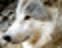

In [11]:
print("31px -> 62px")
bi = BicubicInterpolation(X32_valid_paths[4], scale)
out = (bi.forward(Image.open(X64_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/2X/31px', exist_ok=True)
img.save('image_results/2X/31px/Bicubic_31px.png')
img

63px -> 126px


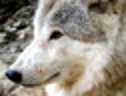

In [12]:
print("63px -> 126px")
bi = BicubicInterpolation(X16_valid_paths[4], scale)
out = (bi.forward(Image.open(X32_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/2X/63px', exist_ok=True)
img.save('image_results/2X/63px/Bicubic_63px.png')
img

127px -> 254px


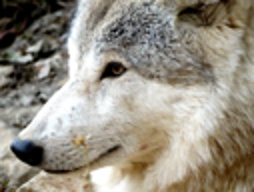

In [13]:
print("127px -> 254px")
bi = BicubicInterpolation(X8_valid_paths[4], scale)
out = (bi.forward(Image.open(X16_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/2X/127px', exist_ok=True)
img.save('image_results/2X/127px/Bicubic_127px.png')
img

255px -> 510px


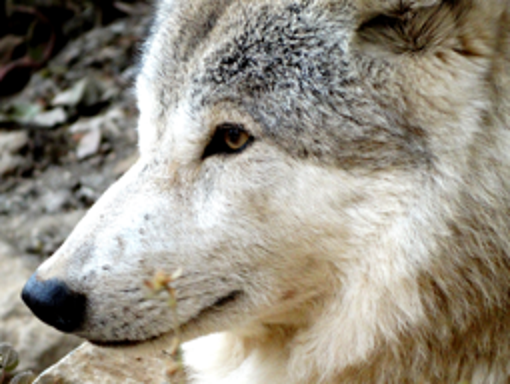

In [14]:
print("255px -> 510px")
bi = BicubicInterpolation(X4_valid_paths[4], scale)
out = (bi.forward(Image.open(X8_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/2X/255px', exist_ok=True)
img.save('image_results/2X/255px/Bicubic_255px.png')
img

510px -> 1020px


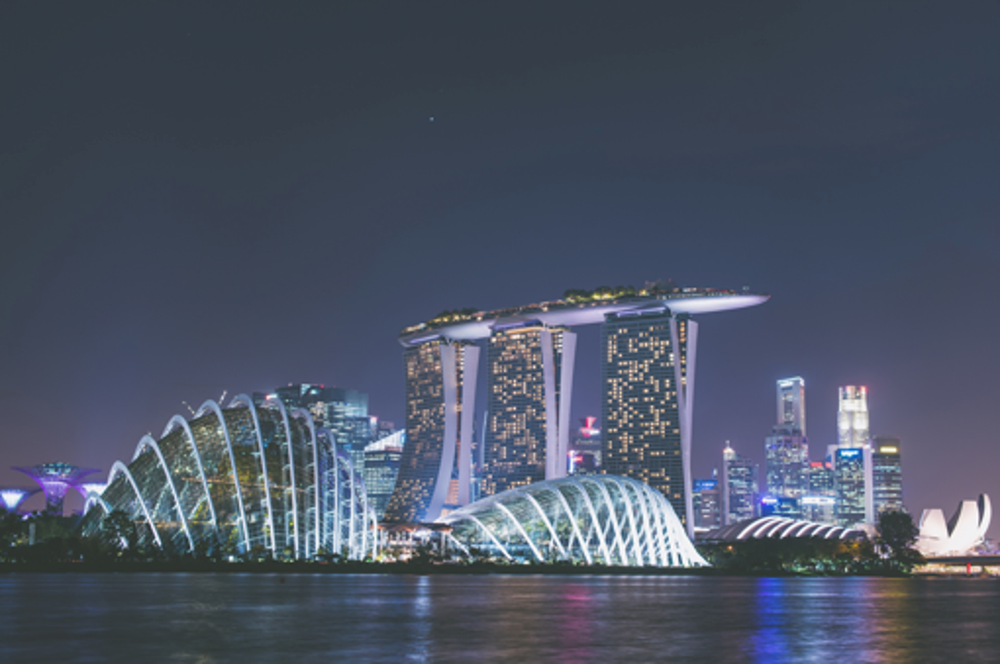

In [12]:
print("510px -> 1020px")
bi = BicubicInterpolation(X2_valid_paths[52], scale)
out = (bi.forward(Image.open(X4_valid_paths[13])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/2X/510px', exist_ok=True)
img.save('image_results/2X/510px/Bicubic_510px.png')
img

In [11]:
X4_valid_paths

[]

1020px -> 2040px


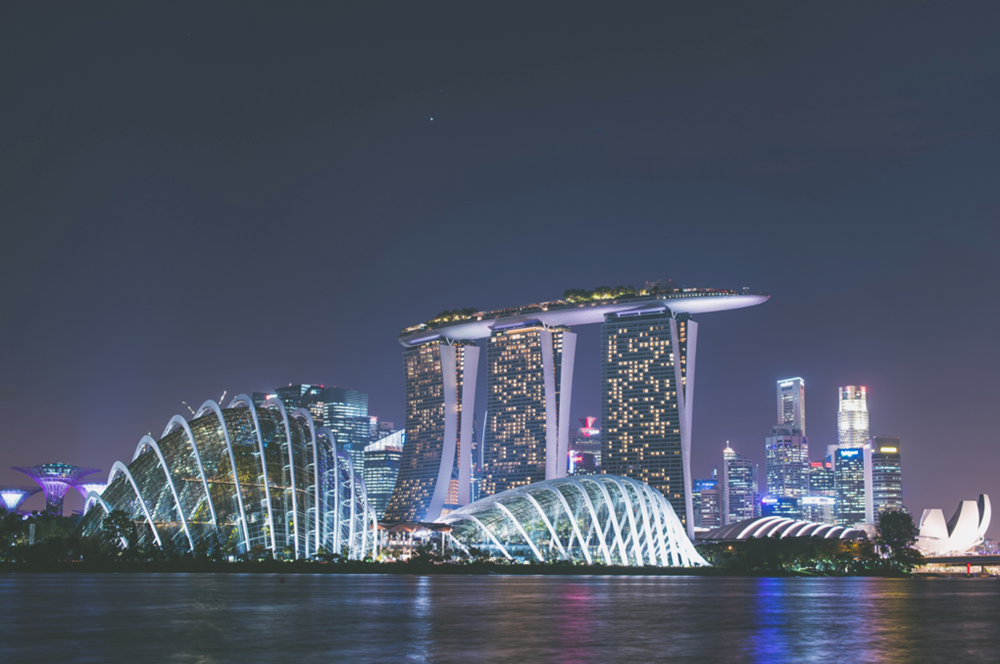

In [13]:
print("1020px -> 2040px")
bi = BicubicInterpolation(HR_valid_paths[13], scale)
out = (bi.forward(Image.open(X2_valid_paths[13])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/2X/1020px', exist_ok=True)
img.save('image_results/2X/1020px/Bicubic_1020px.png')
img

## X4 Scaling

In [17]:
scale = 4

### Metrics calculation

In [18]:
inputs = [X64_valid_paths, X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths]
targets = [X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

In [19]:
metrics_x4 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for input_ds, target_ds in tqdm(zip(inputs, targets), total=5):
    metrics_x4.loc[len(metrics_x4)] = calc_metrics(input_ds, target_ds, scale)

# Create a custom index based on input and target resolutions
metrics_x4.index = ["31px -> 124px", "63px -> 252px", "127px -> 508px", "255px -> 1020px", "510px -> 2040px"]
metrics_x4

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

,PSNR↑,SSIM↑,LPIPS↓
31px -> 124px,19.593208,0.459968,0.531720
63px -> 252px,20.676116,0.518352,0.507779
127px -> 508px,21.703619,0.572381,0.469860
255px -> 1020px,24.277104,0.675014,0.424656
510px -> 2040px,26.645133,0.739786,0.408925


### Super-resolution showcase

31px -> 124px


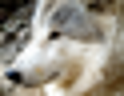

In [20]:
print("31px -> 124px")
bi = BicubicInterpolation(X16_valid_paths[4], scale)
out = (bi.forward(Image.open(X64_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/4X/31px', exist_ok=True)
img.save('image_results/4X/31px/Bicubic_31px.png')
img

63px -> 252px


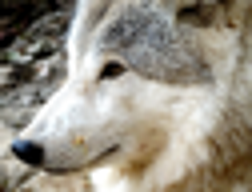

In [21]:
print("63px -> 252px")
bi = BicubicInterpolation(X8_valid_paths[4], scale)
out = (bi.forward(Image.open(X32_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/4X/63px', exist_ok=True)
img.save('image_results/4X/63px/Bicubic_63px.png')
img

127px -> 508px


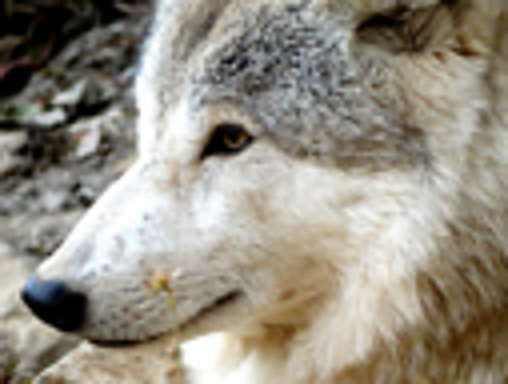

In [22]:
print("127px -> 508px")
bi = BicubicInterpolation(X4_valid_paths[4], scale)
out = (bi.forward(Image.open(X16_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/4X/127px', exist_ok=True)
img.save('image_results/4X/127px/Bicubic_127px.png')
img

255px -> 1020px


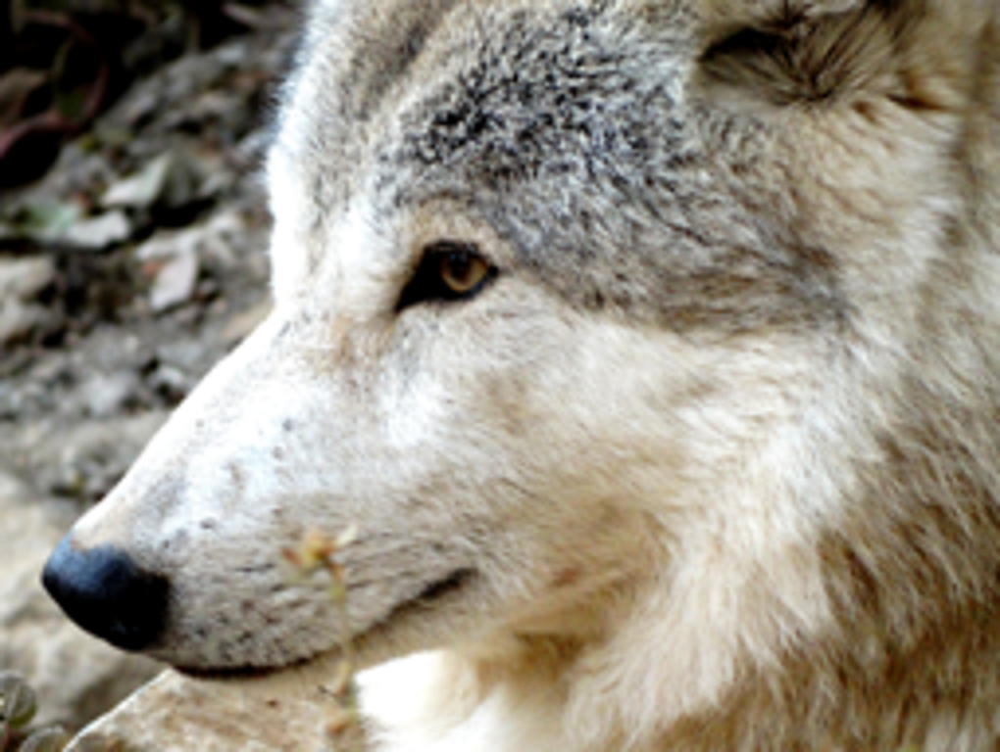

In [23]:
print("255px -> 1020px")
bi = BicubicInterpolation(X2_valid_paths[4], scale)
out = (bi.forward(Image.open(X8_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/4X/255px', exist_ok=True)
img.save('image_results/4X/255px/Bicubic_255px.png')
img

510px -> 2040px


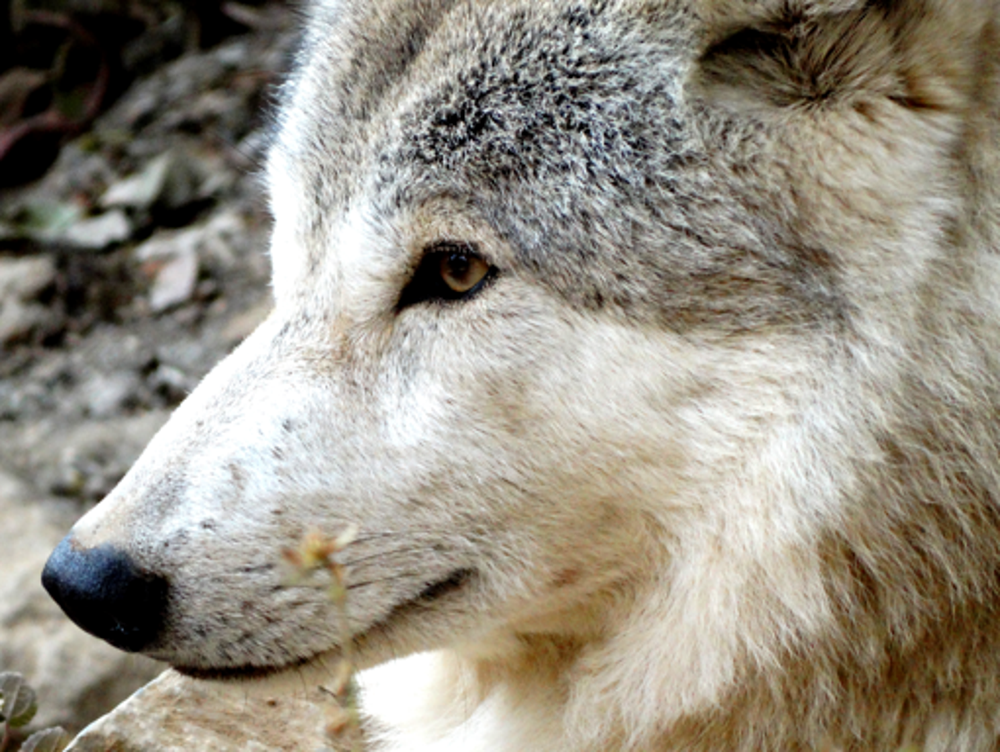

In [24]:
print("510px -> 2040px")
bi = BicubicInterpolation(HR_valid_paths[4], scale)
out = (bi.forward(Image.open(X4_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/4X/510px', exist_ok=True)
img.save('image_results/4X/510px/Bicubic_510px.png')
img

## X8 Scaling

In [25]:
scale = 8

### Metrics calculation

In [26]:
inputs = [X64_valid_paths, X32_valid_paths, X16_valid_paths, X8_valid_paths]
targets = [X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

In [27]:
metrics_x8 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for input_ds, target_ds in tqdm(zip(inputs, targets), total=4):
    metrics_x8.loc[len(metrics_x8)] = calc_metrics(input_ds, target_ds, scale)

# Create a custom index based on input and target resolutions
metrics_x8.index = ["31px -> 248px", "63px -> 504px", "127px -> 1016px", "255px -> 2040px"]
metrics_x8

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

,PSNR↑,SSIM↑,LPIPS↓
31px -> 248px,18.326523,0.366384,0.718362
63px -> 504px,19.506208,0.440263,0.674087
127px -> 1016px,20.757618,0.514385,0.621123
255px -> 2040px,23.068597,0.596154,0.588935


### Super-resolution showcase

31px -> 248px


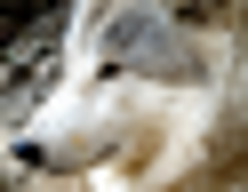

In [28]:
print("31px -> 248px")
bi = BicubicInterpolation(X8_valid_paths[4], scale)
out = (bi.forward(Image.open(X64_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/8X/31px', exist_ok=True)
img.save('image_results/8X/31px/Bicubic_31px.png')
img

63px -> 504px


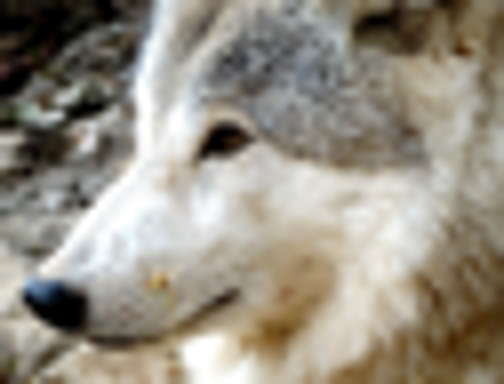

In [29]:
print("63px -> 504px")
bi = BicubicInterpolation(X4_valid_paths[4], scale)
out = (bi.forward(Image.open(X32_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/8X/63px', exist_ok=True)
img.save('image_results/8X/63px/Bicubic_63px.png')
img

127px -> 1016px


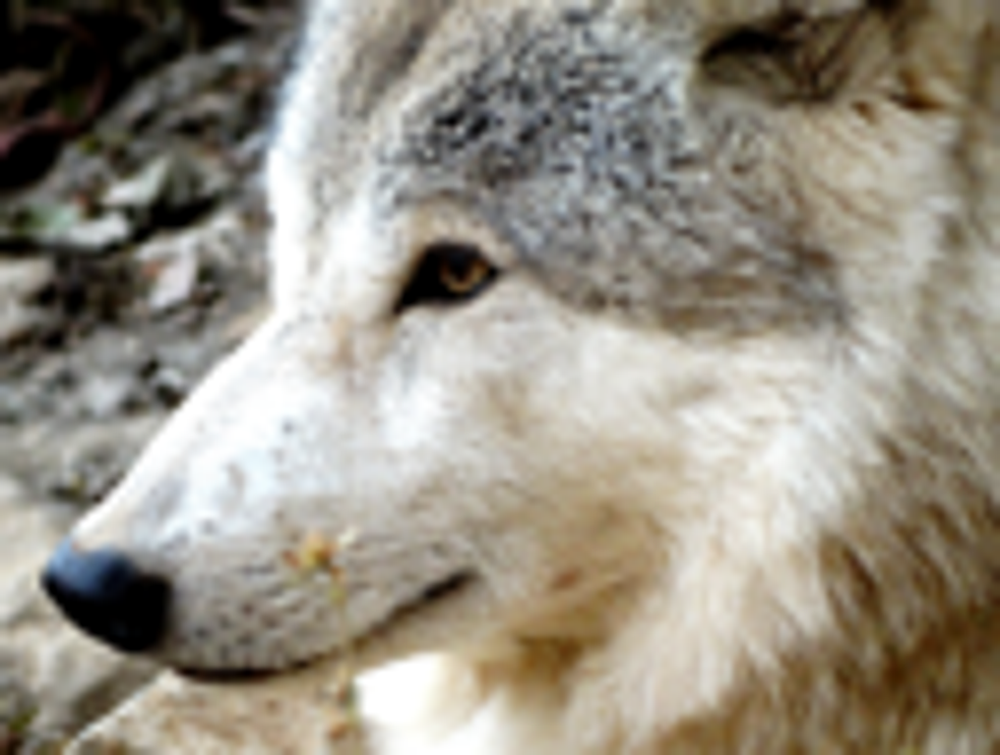

In [30]:
print("127px -> 1016px")
bi = BicubicInterpolation(X2_valid_paths[4], scale)
out = (bi.forward(Image.open(X16_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/8X/127px', exist_ok=True)
img.save('image_results/8X/127px/Bicubic_127px.png')
img

255px -> 2040px


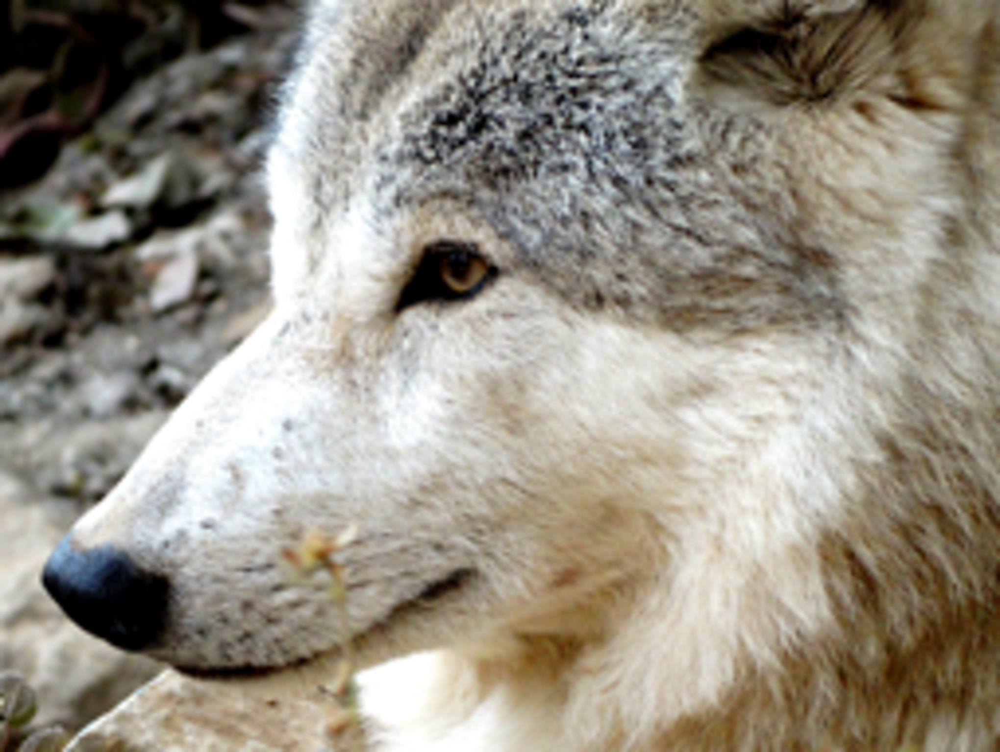

In [31]:
print("255px -> 2040px")
bi = BicubicInterpolation(HR_valid_paths[4], scale)
out = (bi.forward(Image.open(X8_valid_paths[4])) + 1.0) / 2.0 * 255.0
img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).numpy())
os.makedirs('image_results/8X/255px', exist_ok=True)
img.save('image_results/8X/255px/Bicubic_255px.png')
img

## Final Results

In [32]:
index_x2 = pd.MultiIndex.from_product([["X2"], [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]], names=["Scaling", "Resolution"])

index_x4 = pd.MultiIndex.from_product([["X4"], [
    "31px -> 124px", "63px -> 252px", "127px -> 508px", 
    "255px -> 1020px", "510px -> 2040px"
]], names=["Scaling", "Resolution"])

index_x8 = pd.MultiIndex.from_product([["X8"], [
    "31px -> 248px", "63px -> 504px", "127px -> 1016px", "255px -> 2040px"]], names=["Scaling", "Resolution"])

metrics_x2.index = index_x2
metrics_x4.index = index_x4
metrics_x8.index = index_x8

empty_row = pd.DataFrame([[np.nan, np.nan, np.nan]], columns=["PSNR↑", "SSIM↑", "LPIPS↓"], 
                         index = pd.MultiIndex.from_tuples([("--", "--")], names=["Scaling", "Resolution"]))
metrics_full = pd.concat([metrics_x2, empty_row, metrics_x4, empty_row, metrics_x8])
metrics_full

PSNR↑     SSIM↑    LPIPS↓
Scaling Resolution                                     
X2      31px -> 62px      22.388194  0.721647  0.170294
        63px -> 126px     23.642673  0.756080  0.225378
        127px -> 254px    24.268757  0.761469  0.223295
        255px -> 510px    26.493798  0.824881  0.204265
        510px -> 1020px   29.593097  0.887717  0.173096
        1020px -> 2040px  30.987346  0.890560  0.183161
--      --                      NaN       NaN       NaN
X4      31px -> 124px     19.593208  0.459968  0.531720
        63px -> 252px     20.676116  0.518352  0.507779
        127px -> 508px    21.703619  0.572381  0.469860
        255px -> 1020px   24.277104  0.675014  0.424656
        510px -> 2040px   26.645133  0.739786  0.408925
--      --                      NaN       NaN       NaN
X8      31px -> 248px     18.326523  0.366384  0.718362
        63px -> 504px     19.506208  0.440263  0.674087
        127px -> 1016px   20.757618  0.514385  0.621123
        255px -> 2040px   23.068597  0.596154  0.588935

### Save the results for later comparison

In [33]:
os.makedirs('metrics_results', exist_ok=True)
metrics_full.to_parquet("metrics_results/bicubic_results.parquet", engine="pyarrow")

In [34]:
df = pd.read_parquet("metrics_results/bicubic_results.parquet")
df

PSNR↑     SSIM↑    LPIPS↓
Scaling Resolution                                     
X2      31px -> 62px      22.388194  0.721647  0.170294
        63px -> 126px     23.642673  0.756080  0.225378
        127px -> 254px    24.268757  0.761469  0.223295
        255px -> 510px    26.493798  0.824881  0.204265
        510px -> 1020px   29.593097  0.887717  0.173096
        1020px -> 2040px  30.987346  0.890560  0.183161
--      --                      NaN       NaN       NaN
X4      31px -> 124px     19.593208  0.459968  0.531720
        63px -> 252px     20.676116  0.518352  0.507779
        127px -> 508px    21.703619  0.572381  0.469860
        255px -> 1020px   24.277104  0.675014  0.424656
        510px -> 2040px   26.645133  0.739786  0.408925
--      --                      NaN       NaN       NaN
X8      31px -> 248px     18.326523  0.366384  0.718362
        63px -> 504px     19.506208  0.440263  0.674087
        127px -> 1016px   20.757618  0.514385  0.621123
        255px -> 2040px   23.068597  0.596154  0.588935